In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import datetime
warnings.filterwarnings("ignore")

In [7]:
# Reading the dataset
data = pd.read_excel('StateAndCategory.xlsx', "By State and Product Category")

In [9]:
data.tail(100).T

,88830,88831,88832,88833,88834,88835,88836,88837,88838,88839,...,88920,88921,88922,88923,88924,88925,88926,88927,88928,88929
Weekly retail food sales by State and product category,2021-07-18,2021-07-25,2021-08-01,2021-08-08,2021-08-15,2021-08-22,2021-08-29,2021-09-05,2021-09-12,2021-09-19,...,2023-04-09,2023-04-16,2023-04-23,2023-04-30,2023-05-07,NA = data are not available,Note: The series is subject to revision based ...,"Source: USDA, Economic Research Service calcul...","Data as of May 7, 2023.","Errata: On July 7, 2023, the volume sales data..."
Unnamed: 1,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,...,Wyoming,Wyoming,Wyoming,Wyoming,Wyoming,NaN,NaN,NaN,NaN,NaN
Unnamed: 2,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,...,Vegetables,Vegetables,Vegetables,Vegetables,Vegetables,NaN,NaN,NaN,NaN,NaN
Unnamed: 3,2175797,2172016,2110353,2187059,2086394,2050163,1997988,2197349,2044976,2037966,...,2725351,2194356,2273961,2292042,2454255,NaN,NaN,NaN,NaN,NaN
Unnamed: 4,1075429,1082155,1070501,1110049,1061495,1040562,1010766,1110769,1040810,1024275,...,1167042,939705,982949,996170,1080178,NaN,NaN,NaN,NaN,NaN
Unnamed: 5,2324384,2234995,2180080,2221188,2148621,2095881,2084726,2274218,2145768,2099343,...,2289493,2468826,2139606,2171236,2308865,NaN,NaN,NaN,NaN,NaN
Unnamed: 6,1179592,1139037,1125517,1143412,1100672,1070798,1075428,1199061,1127728,1066304,...,1074568,1139694,992877,1017844,1067044,NaN,NaN,NaN,NaN,NaN
Unnamed: 7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2515451,2327153,2354293,2373053,2423610,NaN,NaN,NaN,NaN,NaN
Unnamed: 8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1296931,1208033,1207688,1213977,1246013,NaN,NaN,NaN,NaN,NaN
Unnamed: 9,-6.4,-2.8,-3.2,-1.5,-2.9,-2.2,-4.2,-3.4,-4.7,-2.9,...,19,-11.1,6.3,5.6,6.3,NaN,NaN,NaN,NaN,NaN


In [11]:
data.drop(data.tail(1).index,
        inplace = True)
data.tail() #removing the last 4 entries because they are just informational

,Weekly retail food sales by State and product category,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
88920,2023-04-09,Wyoming,Vegetables,2725351,1167042,2289493,1074568,2515451,1296931,19,8.6,8.3,-10
88921,2023-04-16,Wyoming,Vegetables,2194356,939705,2468826,1139694,2327153,1208033,-11.1,-17.5,-5.7,-22.2
88922,2023-04-23,Wyoming,Vegetables,2273961,982949,2139606,992877,2354293,1207688,6.3,-1,-3.4,-18.6
88923,2023-04-30,Wyoming,Vegetables,2292042,996170,2171236,1017844,2373053,1213977,5.6,-2.1,-3.4,-17.9
88924,2023-05-07,Wyoming,Vegetables,2454255,1080178,2308865,1067044,2423610,1246013,6.3,1.2,1.3,-13.3


In [12]:
data.Category.value_counts()

AttributeError: 'DataFrame' object has no attribute 'Category'

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75207 entries, 0 to 75206
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Date                            75207 non-null  object 
 1   State                           75207 non-null  object 
 2   Category                        75207 non-null  object 
 3   Dollars                         75207 non-null  object 
 4   Unit sales                      75191 non-null  object 
 5   Volume sales                    68370 non-null  object 
 6   Dollars last year               74933 non-null  object 
 7   Unit sales last year            74903 non-null  object 
 8   Volume sales last year          68115 non-null  object 
 9   Dollars 3 years ago             25745 non-null  object 
 10  Unit sales 3 years ago          25738 non-null  object 
 11  Volume sales 3 years ago        23402 non-null  object 
 12  Percent change dollars 1 year   

In [7]:
df = data.copy()
#float(data.Dollars.replace('$',''))
df['Dollars_Converted'] = df['Dollars'].str.replace(',', '')
df['Dollars_Converted'] = df['Dollars_Converted'].str.replace('$', '')
#float(df.Dollars_Converted)


df.info()

#(data.Dollars).apply(lambda x: float(x))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75207 entries, 0 to 75206
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Date                            75207 non-null  object 
 1   State                           75207 non-null  object 
 2   Category                        75207 non-null  object 
 3   Dollars                         75207 non-null  object 
 4   Unit sales                      75191 non-null  object 
 5   Volume sales                    68370 non-null  object 
 6   Dollars last year               74933 non-null  object 
 7   Unit sales last year            74903 non-null  object 
 8   Volume sales last year          68115 non-null  object 
 9   Dollars 3 years ago             25745 non-null  object 
 10  Unit sales 3 years ago          25738 non-null  object 
 11  Volume sales 3 years ago        23402 non-null  object 
 12  Percent change dollars 1 year   



                           While this information is very helpful, we need to see this in
                           the perspective of pricing the individual units to find trends in the pricing. 
                           This will help us make better decisions on which category (if we are 
                           going to limit this by category) to choose for the analysis. OR
                           The entire presentation could be covering the categories themselves. 
                           
                           
                           

In [8]:
#df['Dollars_Converted'].apply(type).value_counts()
df['Unit_Converted'] = df['Unit sales'].str.replace(',', '')


df['Unit_Converted']= df['Unit_Converted'].astype(float)
df['Dollars_Converted'] = df['Dollars_Converted'].astype(float)

 
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 75207 entries, 0 to 75206
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Date                            75207 non-null  object 
 1   State                           75207 non-null  object 
 2   Category                        75207 non-null  object 
 3   Dollars                         75207 non-null  object 
 4   Unit sales                      75191 non-null  object 
 5   Volume sales                    68370 non-null  object 
 6   Dollars last year               74933 non-null  object 
 7   Unit sales last year            74903 non-null  object 
 8   Volume sales last year          68115 non-null  object 
 9   Dollars 3 years ago             25745 non-null  object 
 10  Unit sales 3 years ago          25738 non-null  object 
 11  Volume sales 3 years ago        23402 non-null  object 
 12  Percent change dollars 1 year   

In [9]:
df['Price_per_Unit'] = (df['Dollars_Converted'] / df['Unit_Converted'])
df.head().T

,0,1,2,3,4
Date,2019-10-06,2019-10-13,2019-10-20,2019-10-27,2019-11-03
State,Alabama,Alabama,Alabama,Alabama,Alabama
Category,Alcohol,Alcohol,Alcohol,Alcohol,Alcohol
Dollars,"$23,580,628","$23,191,408","$21,743,590","$21,929,512","$23,150,890"
Unit sales,"2,969,760","2,891,303","2,727,065","2,761,075","2,868,207"
Volume sales,"836,512","828,622","761,632","767,176","813,904"
Dollars last year,"$22,435,659","$23,309,843","$21,063,269","$20,183,470","$22,560,881"
Unit sales last year,"2,976,745","2,977,404","2,744,731","2,650,938","2,883,969"
Volume sales last year,"814,795","854,999","765,890","713,505","801,436"
Dollars 3 years ago,NaN,NaN,NaN,NaN,NaN


In [10]:
df.isnull().sum()

Date                                  0
State                                 0
Category                              0
Dollars                               0
Unit sales                           16
Volume sales                       6837
Dollars last year                   274
Unit sales last year                304
Volume sales last year             7092
Dollars 3 years ago               49462
Unit sales 3 years ago            49469
Volume sales 3 years ago          51805
Percent change dollars 1 year       274
Percent change units 1 year         304
Percent change volume 1 year       7092
Percent change dollars 3 years    49462
Percent change units 3 years      49485
Percent change volume 3 years     51805
Dollars_Converted                     0
Unit_Converted                       16
Price_per_Unit                       16
dtype: int64

In [11]:
#efficient way to extract year from string format date
df_19 = df.loc[df['Date'].str.contains('2019', case = False)]

df_19.head()

,Date,State,Category,Dollars,Unit sales,Volume sales,Dollars last year,Unit sales last year,Volume sales last year,Dollars 3 years ago,...,Volume sales 3 years ago,Percent change dollars 1 year,Percent change units 1 year,Percent change volume 1 year,Percent change dollars 3 years,Percent change units 3 years,Percent change volume 3 years,Dollars_Converted,Unit_Converted,Price_per_Unit
0,2019-10-06,Alabama,Alcohol,"$23,580,628","2,969,760","836,512","$22,435,659","2,976,745","814,795",NaN,...,NaN,5.1,-0.2,2.7,NaN,NaN,NaN,23580628.0,2969760.0,7.940247
1,2019-10-13,Alabama,Alcohol,"$23,191,408","2,891,303","828,622","$23,309,843","2,977,404","854,999",NaN,...,NaN,-0.5,-2.9,-3.1,NaN,NaN,NaN,23191408.0,2891303.0,8.021092
2,2019-10-20,Alabama,Alcohol,"$21,743,590","2,727,065","761,632","$21,063,269","2,744,731","765,890",NaN,...,NaN,3.2,-0.6,-0.6,NaN,NaN,NaN,21743590.0,2727065.0,7.973257
3,2019-10-27,Alabama,Alcohol,"$21,929,512","2,761,075","767,176","$20,183,470","2,650,938","713,505",NaN,...,NaN,8.7,4.2,7.5,NaN,NaN,NaN,21929512.0,2761075.0,7.942382
4,2019-11-03,Alabama,Alcohol,"$23,150,890","2,868,207","813,904","$22,560,881","2,883,969","801,436",NaN,...,NaN,2.6,-0.5,1.6,NaN,NaN,NaN,23150890.0,2868207.0,8.071555


In [12]:
df_20 = df.loc[df['Date'].str.contains('2020', case = False)] # break up of the data by year
df_21 = df.loc[df['Date'].str.contains('2021', case = False)]
df_22 = df.loc[df['Date'].str.contains('2022', case = False)]




                                OK, now that we have it broken up by price per 
                                unit lets look to see if we can identify trends 
                                over time for each category. 
                                
                                
                                

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

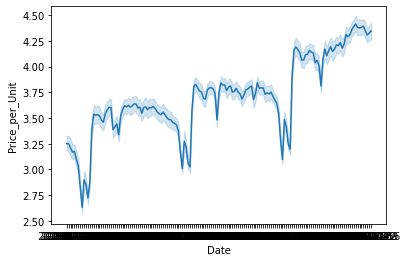

In [13]:
df_bake = df[(df['Category'] == 'Sugar and sweeteners')] # | (df['Category'] == 'Grains')]

sns.lineplot(data=df_bake, y="Price_per_Unit", x="Date")





                                                    *****
                                                    
                                                    
                                             There is obvious trends for
                                             sugar and sweeteners!
                                             
              
                                                    *****

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

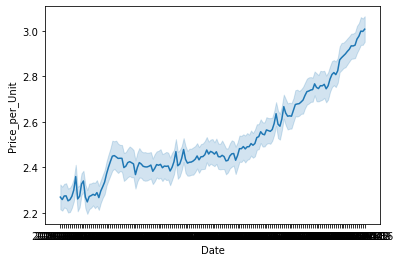

In [14]:
df_grain = df[(df['Category'] == 'Grains')]
sns.lineplot(data=df_grain, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

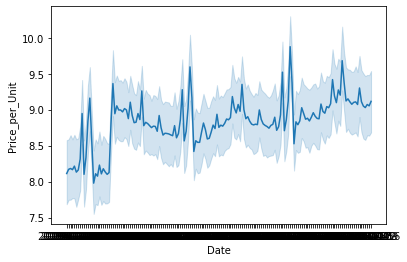

In [15]:
df_alcohol = df[(df['Category'] == 'Alcohol')]
sns.lineplot(data=df_alcohol, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

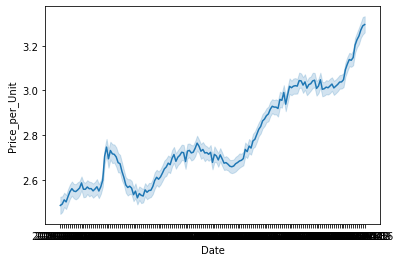

In [16]:
df_Beverages = df[(df['Category'] == 'Beverages')]
sns.lineplot(data=df_Beverages, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

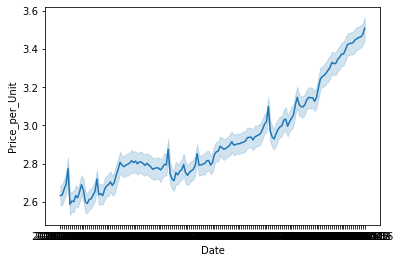

In [17]:
df_Commercial = df[(df['Category'] == 'Commercially prepared items')]
sns.lineplot(data=df_Commercial, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

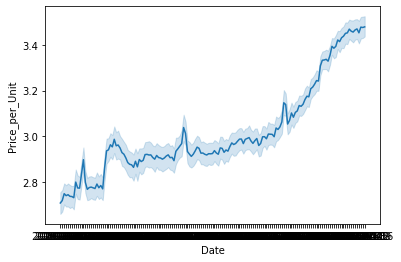

In [18]:
df_Dairy = df[(df['Category'] == 'Dairy')]
sns.lineplot(data=df_Dairy, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

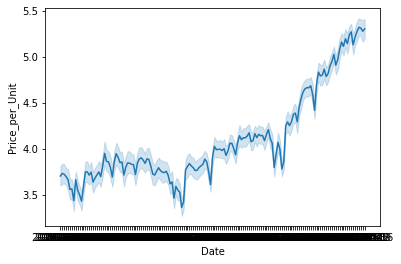

In [19]:
df_FO = df[(df['Category'] == 'Fats and oils')]
sns.lineplot(data=df_FO, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

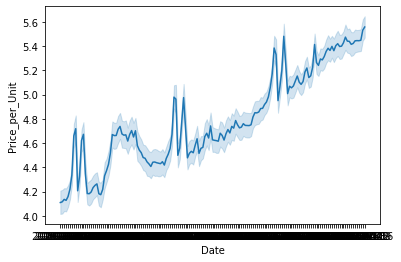

In [20]:
df_Meats_etc = df[(df['Category'] == 'Meats, eggs, and nuts')]
sns.lineplot(data=df_Meats_etc, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

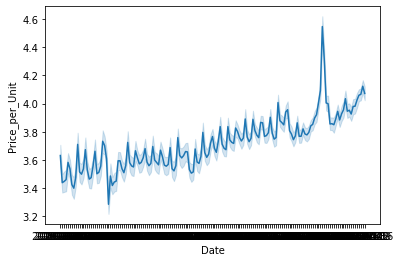

In [21]:
df_Other = df[(df['Category'] == 'Other')]
sns.lineplot(data=df_Other, y="Price_per_Unit", x="Date")

<AxesSubplot:xlabel='Date', ylabel='Price_per_Unit'>

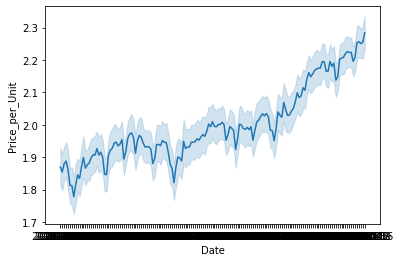

In [22]:
df_Vegetables = df[(df['Category'] == 'Vegetables')]
sns.lineplot(data=df_Vegetables, y="Price_per_Unit", x="Date")




                                                    *****
                                                    
                                                    
                                       I think it would be very telling to overlap 
                                       all of these line plots to see if there is a clear
                                       overall trend of market drop


                                                    *****
                                       
                                       
                                       
                                       
                              

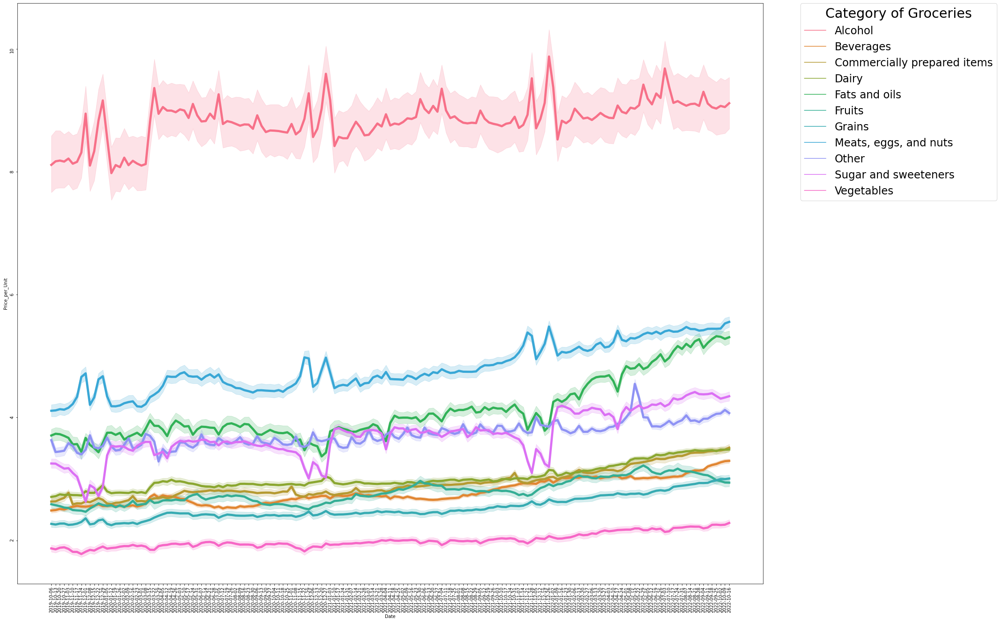

In [23]:
fig = plt.figure(figsize= (30,24))
ax = sns.lineplot(data=df, y="Price_per_Unit", x="Date", hue = 'Category', lw = 5 )


leg = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')
leg.get_lines()
ax.tick_params(rotation=90)
plt.show()




                                                    *****
                                       
                                       
                                       
                                 This is excellent! I can clearly see that the red,
                                 blue, green, purple and pink lines show obvious
                                 and distinct fluxuations in price over time. 
                                 
                                 
                                 Unfortunatly, the legend is so small it difficult to 
                                 see which of the Categories line up with what the color
                                 belongs to. 
                                 
                                 I propose that we move forward with those Categories
                                 with the clear fluxuations. 
                                 
                                 


                                                    *****
                                                    

In [24]:
import plotly.graph_objects as go

Now lets graph each year see if the trends hold over each year

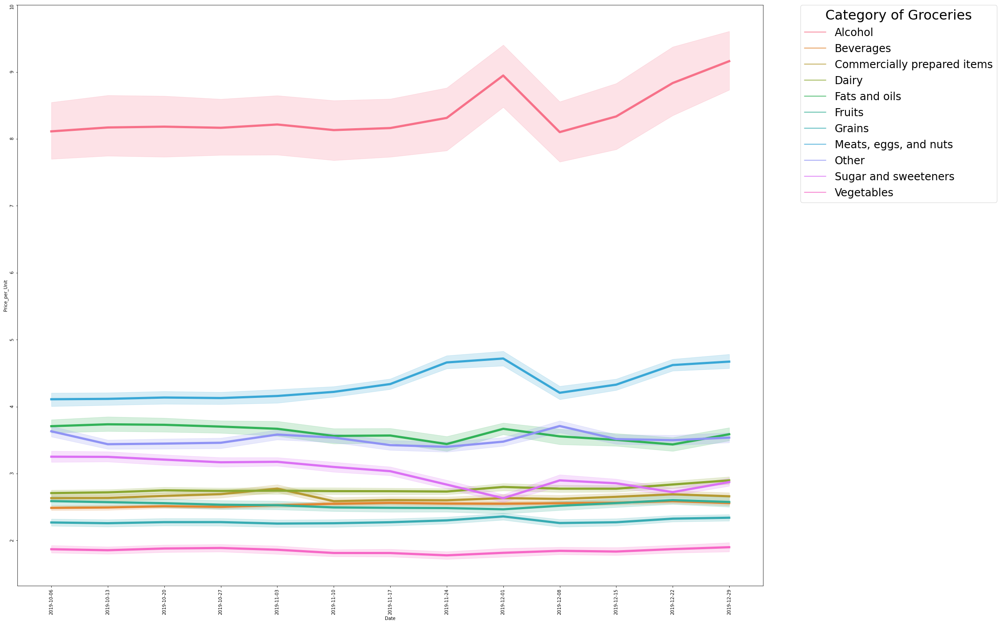

In [25]:
fig = plt.figure(figsize= (30,24))
ax = sns.lineplot(data=df_19, y="Price_per_Unit", x="Date", hue = 'Category', lw = 5 )


leg = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')
leg.get_lines()
ax.tick_params(rotation=90)
plt.show()

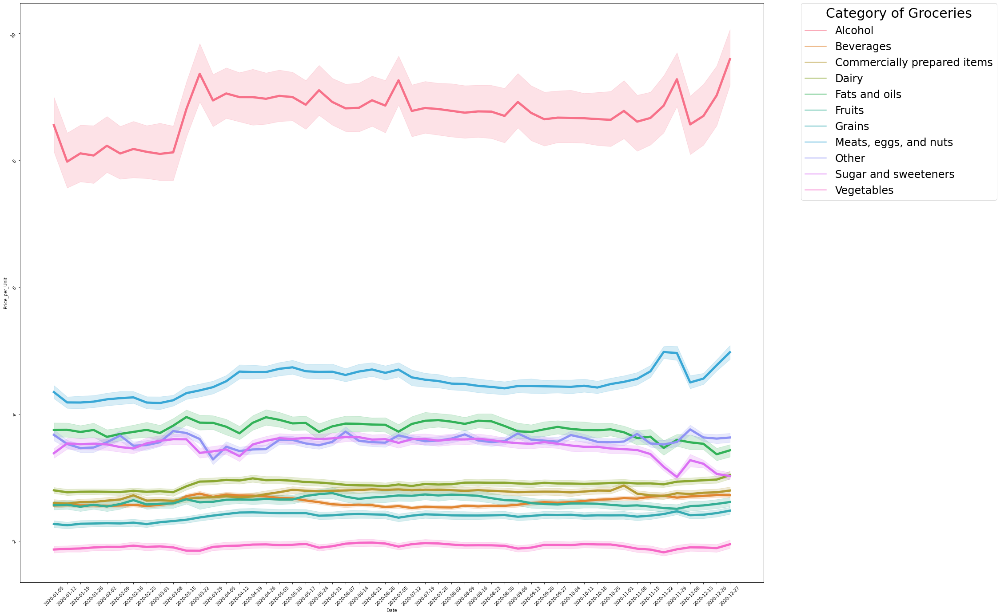

In [26]:
fig = plt.figure(figsize= (30,24))
ax = sns.lineplot(data=df_20, y="Price_per_Unit", x="Date", hue = 'Category', lw = 5 )


leg = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')

ax.tick_params(rotation=45)
plt.show()

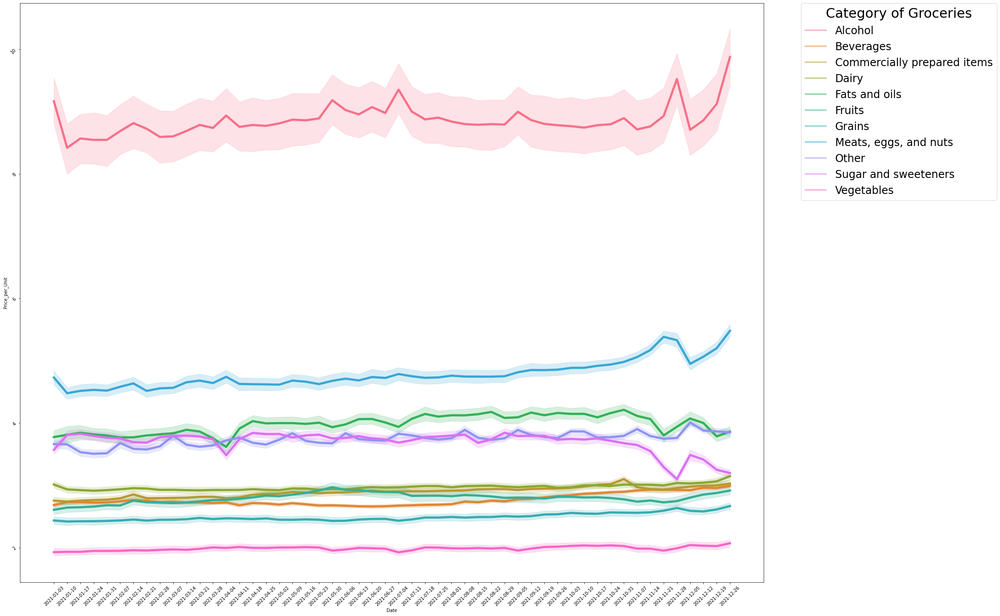

In [27]:
fig = plt.figure(figsize= (30,24))
ax = sns.lineplot(data=df_21, y="Price_per_Unit", x="Date", hue = 'Category', lw = 5 )


leg = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')

ax.tick_params(rotation=45)
plt.show()

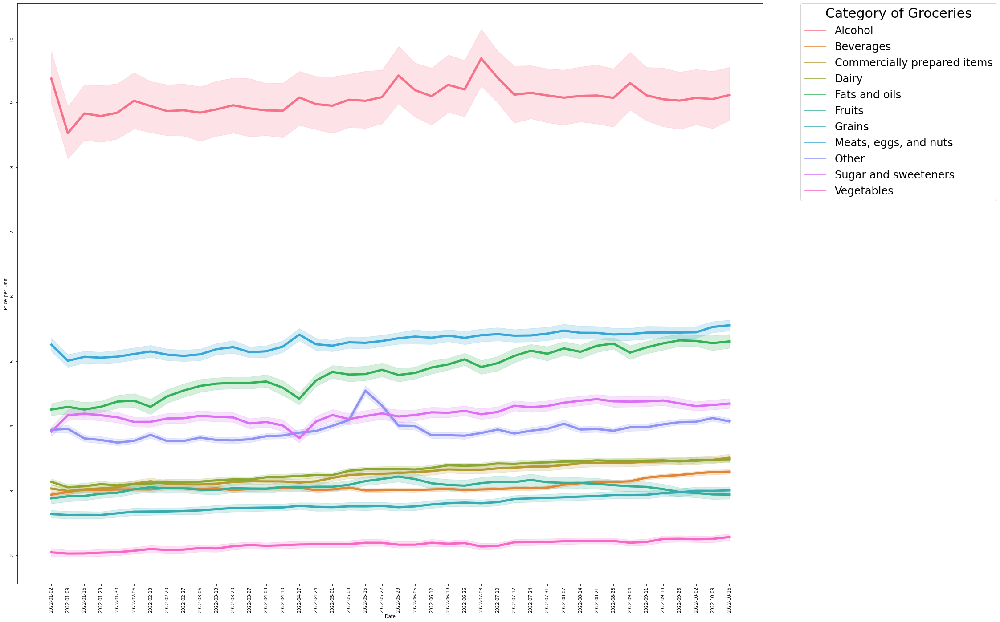

In [28]:
fig = plt.figure(figsize= (30,24))
ax = sns.lineplot(data=df_22, y="Price_per_Unit", x="Date", hue = 'Category', lw = 5 )


leg = plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')

ax.tick_params(rotation=90)
plt.show()

I am going to try to make a better map with improved tickmarks

In [29]:
list_scode = list(set(df['State']))
list_add = list(df['Category'])
df.head()

,Date,State,Category,Dollars,Unit sales,Volume sales,Dollars last year,Unit sales last year,Volume sales last year,Dollars 3 years ago,...,Volume sales 3 years ago,Percent change dollars 1 year,Percent change units 1 year,Percent change volume 1 year,Percent change dollars 3 years,Percent change units 3 years,Percent change volume 3 years,Dollars_Converted,Unit_Converted,Price_per_Unit
0,2019-10-06,Alabama,Alcohol,"$23,580,628","2,969,760","836,512","$22,435,659","2,976,745","814,795",NaN,...,NaN,5.1,-0.2,2.7,NaN,NaN,NaN,23580628.0,2969760.0,7.940247
1,2019-10-13,Alabama,Alcohol,"$23,191,408","2,891,303","828,622","$23,309,843","2,977,404","854,999",NaN,...,NaN,-0.5,-2.9,-3.1,NaN,NaN,NaN,23191408.0,2891303.0,8.021092
2,2019-10-20,Alabama,Alcohol,"$21,743,590","2,727,065","761,632","$21,063,269","2,744,731","765,890",NaN,...,NaN,3.2,-0.6,-0.6,NaN,NaN,NaN,21743590.0,2727065.0,7.973257
3,2019-10-27,Alabama,Alcohol,"$21,929,512","2,761,075","767,176","$20,183,470","2,650,938","713,505",NaN,...,NaN,8.7,4.2,7.5,NaN,NaN,NaN,21929512.0,2761075.0,7.942382
4,2019-11-03,Alabama,Alcohol,"$23,150,890","2,868,207","813,904","$22,560,881","2,883,969","801,436",NaN,...,NaN,2.6,-0.5,1.6,NaN,NaN,NaN,23150890.0,2868207.0,8.071555


In [30]:

list_YM = [i.split(" ")[0][:-3] for i in  list(df['Date'])]
list_Year = [i.split(" ")[0][0:4] for i in  list(df['Date'])]
list_Month = [i.split(" ")[0][5:7] for i in  list(df['Date'])]


df['Year'] = list_Year
df['Month'] = list_Month
df['YM'] = list_YM

#create a monthly dataframe
df_monthly = df.groupby(['State', 'Category', 'Year']).mean()


df_monthly.tail()

Percent change dollars 1 year  \
State   Category             Year                                  
Wyoming Sugar and sweeteners 2022                       9.130952   
        Vegetables           2019                       2.423077   
                             2020                       8.832692   
                             2021                      -3.611538   
                             2022                       5.290476   

                                   Percent change units 1 year  \
State   Category             Year                                
Wyoming Sugar and sweeteners 2022                    -2.071429   
        Vegetables           2019                     1.907692   
                             2020                     8.138462   
                             2021                    -6.213462   
                             2022                    -3.528571   

                                   Percent change volume 1 year  \
State   Category             Year                                 
Wyoming Sugar and sweeteners 2022                     -1.338095   
        Vegetables           2019                     -0.169231   
                             2020                      6.092308   
                             2021                     -9.869231   
                             2022                     -5.121429   

                                   Percent change dollars 3 years  \
State   Category             Year                                   
Wyoming Sugar and sweeteners 2022                       16.535714   
        Vegetables           2019                             NaN   
                             2020                             NaN   
                             2021                        8.715385   
                             2022                        9.052381   

                                   Percent change units 3 years  \
State   Category             Year                                 
Wyoming Sugar and sweeteners 2022                     -4.961905   
        Vegetables           2019                           NaN   
                             2020                           NaN   
                             2021                      1.376923   
                             2022                     -2.871429   

                                   Percent change volume 3 years  \
State   Category             Year                                  
Wyoming Sugar and sweeteners 2022                      -3.804762   
        Vegetables           2019                            NaN   
                             2020                            NaN   
                             2021                      -5.369231   
                             2022                     -10.842857   

                                   Dollars_Converted  Unit_Converted  \
State   Category             Year                                      
Wyoming Sugar and sweeteners 2022       1.338060e+05    2.895062e+04   
        Vegetables           2019       2.064749e+06    1.088905e+06   
                             2020       2.262173e+06    1.172144e+06   
                             2021       2.168107e+06    1.091448e+06   
                             2022       2.271813e+06    1.052786e+06   

                                   Price_per_Unit  
State   Category             Year                  
Wyoming Sugar and sweeteners 2022        4.623062  
        Vegetables           2019        1.895823  
                             2020        1.931952  
                             2021        1.986912  
                             2022        2.158738

In [31]:
import matplotlib.ticker as ticker

In [32]:
df.head()

,Date,State,Category,Dollars,Unit sales,Volume sales,Dollars last year,Unit sales last year,Volume sales last year,Dollars 3 years ago,...,Percent change volume 1 year,Percent change dollars 3 years,Percent change units 3 years,Percent change volume 3 years,Dollars_Converted,Unit_Converted,Price_per_Unit,Year,Month,YM
0,2019-10-06,Alabama,Alcohol,"$23,580,628","2,969,760","836,512","$22,435,659","2,976,745","814,795",NaN,...,2.7,NaN,NaN,NaN,23580628.0,2969760.0,7.940247,2019,10,2019-10
1,2019-10-13,Alabama,Alcohol,"$23,191,408","2,891,303","828,622","$23,309,843","2,977,404","854,999",NaN,...,-3.1,NaN,NaN,NaN,23191408.0,2891303.0,8.021092,2019,10,2019-10
2,2019-10-20,Alabama,Alcohol,"$21,743,590","2,727,065","761,632","$21,063,269","2,744,731","765,890",NaN,...,-0.6,NaN,NaN,NaN,21743590.0,2727065.0,7.973257,2019,10,2019-10
3,2019-10-27,Alabama,Alcohol,"$21,929,512","2,761,075","767,176","$20,183,470","2,650,938","713,505",NaN,...,7.5,NaN,NaN,NaN,21929512.0,2761075.0,7.942382,2019,10,2019-10
4,2019-11-03,Alabama,Alcohol,"$23,150,890","2,868,207","813,904","$22,560,881","2,883,969","801,436",NaN,...,1.6,NaN,NaN,NaN,23150890.0,2868207.0,8.071555,2019,11,2019-11


In [33]:
import plotly.express as px

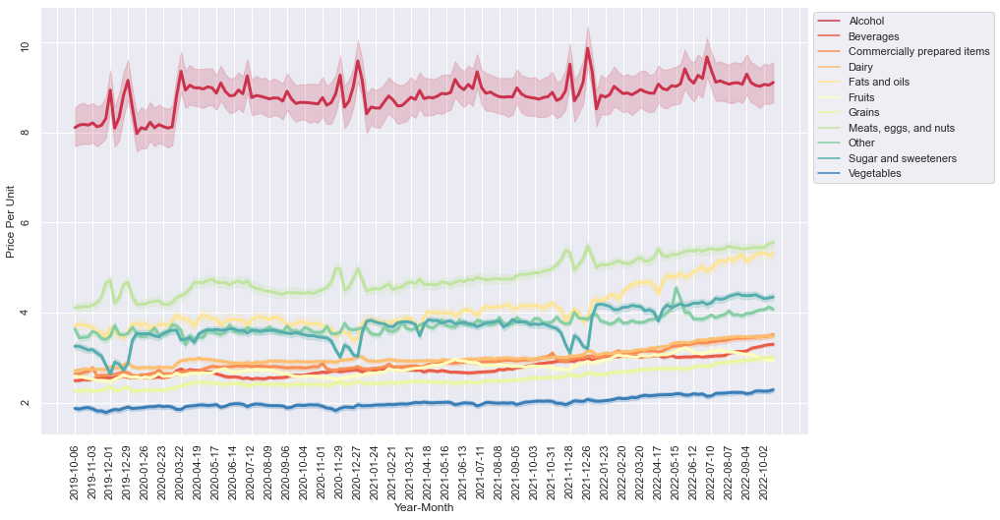

In [34]:
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(14,8)})

ax = sns.lineplot(data=df, x ='Date', y = 'Price_per_Unit',
                  hue='Category', palette='Spectral',
                  legend='full', lw=3)

ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.legend(bbox_to_anchor=(1, 1))
plt.ylabel('Price Per Unit')
plt.xlabel('Year-Month')
ax.tick_params(rotation=90)
plt.show()

In [35]:
#Now lets make it interactive to find out more information about each individual variable

In [36]:
list_scode = list(set(df['Category'])) # setting variables in the next line of code
list_district = list_scode

In [37]:
#extract color palette, the palette can be changed
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex())

fig = go.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(go.Line(x = df[df['Category']==d]['Date'],
                             y = df[df['Category']==d]['Price_per_Unit'],
                             name = d,
                             line_color = p, 
                             fill=None))   #tozeroy 

fig.show()

/Users/andreateal/opt/anaconda3/lib/python3.9/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




                                            ***********
                                            
                                            
                                            
                      There are trends and there is a "Best time" to buy products:​

                                            
                                            Holidays:                                

                                            Sugar/Sweet                                
                                            Fruits                                    
                                            Fats & Oils     


                                            Avoid Holidays:

                                            Alcohol
                                            Beverages (cheapest in summer)
                                            Grains                                        
                                            Meats, Eggs & Nuts
                                            Dairy (Christmas)
    
   

                                    

                                    Vegetables – March & September

                                    

                                    Commercially Prepared Food – Follows a 6-week cycle



                                            **************

In [38]:
#northern states alcohol only
o19 = df[((df['State'] == 'New York') | (df['State'] == 'Connecticut') | (df['State'] == 'Illinois') | 
             (df['State'] == 'Indiana') | (df['State'] == 'Iowa') | (df['State'] == 'Maine') | 
             (df['State'] == 'Massachusetts') | (df['State'] == 'Michigan') | (df['State'] == 'Minnesota') | 
             (df['State'] == 'New Hampshire') | (df['State'] == 'New Jersey') | (df['State'] == 'North Dakota') | 
             (df['State'] == 'Ohio') | (df['State'] == 'Pennsylvania') | (df['State'] == 'Rhode Island') | 
             (df['State'] == 'Vermont') | (df['State'] == 'Wisconsin')) & (df['Category'] == 'Alcohol')]


In [39]:
#southern states alcohol only
o20 = df[((df['State'] == 'Alabama') | (df['State'] == 'Arkansas') | (df['State'] == 'Delaware') | (df['State'] == 'Florida') | (df['State'] == 'Georgia') | (df['State'] == 'Kentucky') |
          (df['State'] == 'Louisiana') | (df['State'] == 'Maryland') | (df['State'] == 'Mississippi') | (df['State'] == 'North Carolina') | (df['State'] == 'Oklahoma') | (df['State'] == 'South Carolina') |
          (df['State'] == 'Tennessee') | (df['State'] == 'Texas') | (df['State'] == 'Virginia') | (df['State'] == 'West Virginia')) & (df['Category'] == 'Alcohol')]

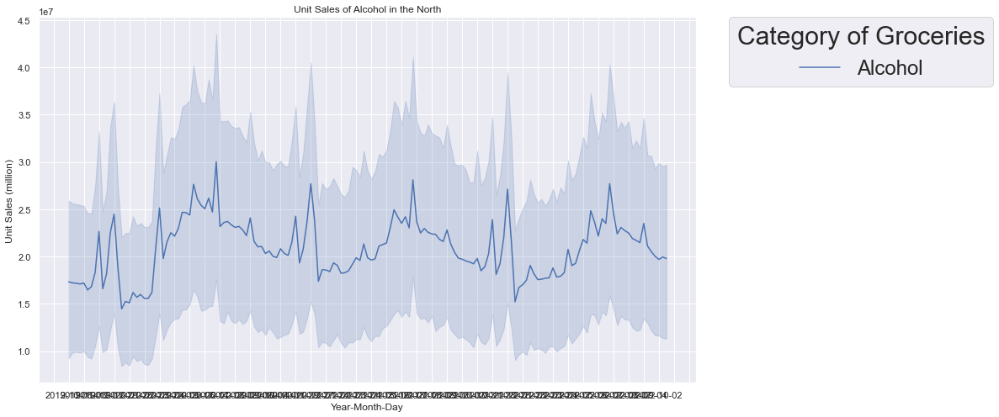

In [40]:
#Addding these two graphs below anyways because we saw that the south on avgerage sold more alcohol which brought up their grocery sales

sns.set_style('darkgrid')
#sns.set(rc={'figure.figsize':(20,8)})
ax = sns.lineplot(data = o19, y="Dollars_Converted", x="Date", hue = "Category")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')
ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.ylabel('Unit Sales (million)')
plt.xlabel('Year-Month-Day')
plt.title('Unit Sales of Alcohol in the North')
plt.show()

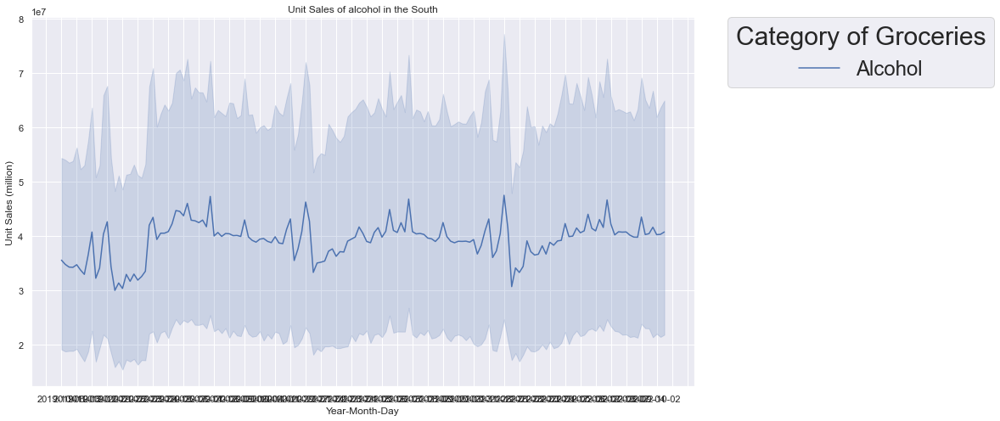

In [41]:
sns.set_style('darkgrid')
#sns.set(rc={'figure.figsize':(20,8)})
ax = sns.lineplot(data = o20, y="Dollars_Converted", x="Date", hue = "Category")

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0,
           title = 'Category of Groceries', fontsize = '24', title_fontsize = '30')
ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.ylabel('Unit Sales (million)')
plt.xlabel('Year-Month-Day')
plt.title('Unit Sales of alcohol in the South')
plt.show()

In [42]:
#northern states all grocery categories
north_all = df[((df['State'] == 'New York') | (df['State'] == 'Connecticut') | (df['State'] == 'Illinois') | 
             (df['State'] == 'Indiana') | (df['State'] == 'Iowa') | (df['State'] == 'Maine') | 
             (df['State'] == 'Massachusetts') | (df['State'] == 'Michigan') | (df['State'] == 'Minnesota') | 
             (df['State'] == 'New Hampshire') | (df['State'] == 'New Jersey') | (df['State'] == 'North Dakota') | 
             (df['State'] == 'Ohio') | (df['State'] == 'Pennsylvania') | (df['State'] == 'Rhode Island') | 
             (df['State'] == 'Vermont') | (df['State'] == 'Wisconsin'))]


In [43]:
#southern states all grocery categories
south_all = df[((df['State'] == 'Alabama') | (df['State'] == 'Arkansas') | (df['State'] == 'Delaware') | (df['State'] == 'Florida') | (df['State'] == 'Georgia') | (df['State'] == 'Kentucky') |
          (df['State'] == 'Louisiana') | (df['State'] == 'Maryland') | (df['State'] == 'Mississippi') | (df['State'] == 'North Carolina') | (df['State'] == 'Oklahoma') | (df['State'] == 'South Carolina') |
          (df['State'] == 'Tennessee') | (df['State'] == 'Texas') | (df['State'] == 'Virginia') | (df['State'] == 'West Virginia'))]

In [44]:
north_total = o19['Unit_Converted'].sum()
south_total = o20['Unit_Converted'].sum()

north_total
south_total

11614189898.0

In [45]:
full_north_total = north_all['Unit_Converted'].sum()
full_south_total = south_all['Unit_Converted'].sum()

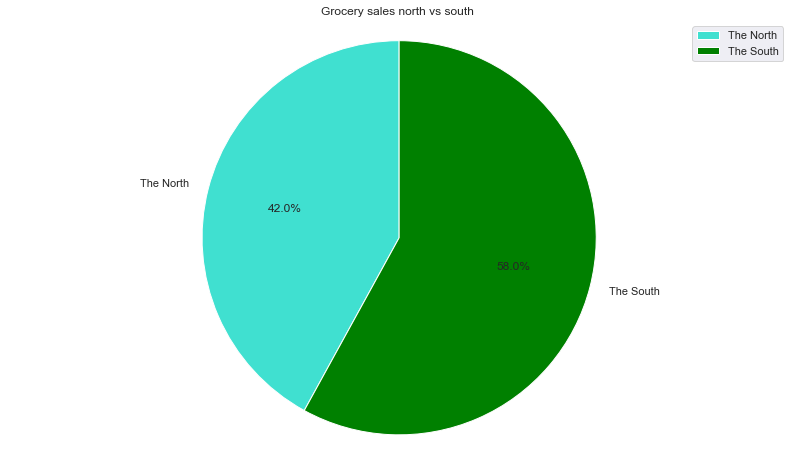

In [46]:
labels= ['The North', 'The South']

colors=['turquoise', 'green']

totals= [full_north_total, full_south_total]

plt.pie(totals, labels=labels, colors=colors, startangle=90, autopct='%1.1f%%')
plt.legend(labels)
plt.title("Grocery sales north vs south")
plt.axis('equal')

plt.show()

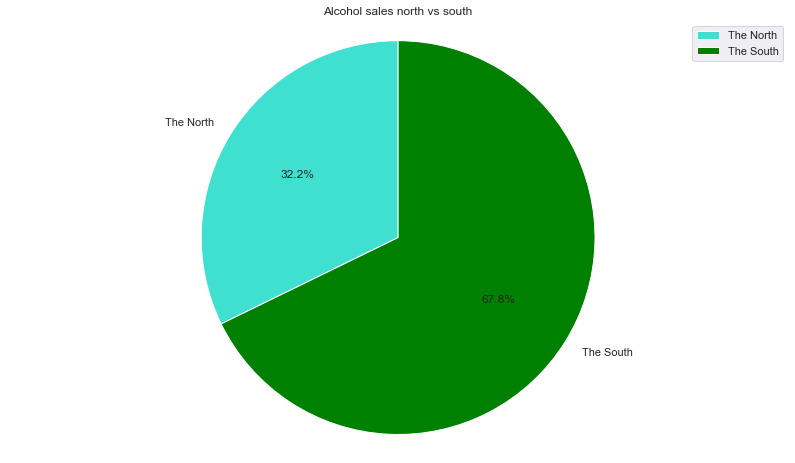

In [47]:
labels1= ['The North', 'The South']

colors=['turquoise', 'green']

totals= [north_total, south_total]

plt.pie(totals, labels=labels, colors=colors, startangle=90, autopct='%1.1f%%')
plt.title("Alcohol sales north vs south")
plt.axis('equal')
plt.legend(labels1)

plt.show()

In [48]:
#focus on onln data for TN
df.drop(df.index[df['State'] != 'Tennessee'], inplace=True)

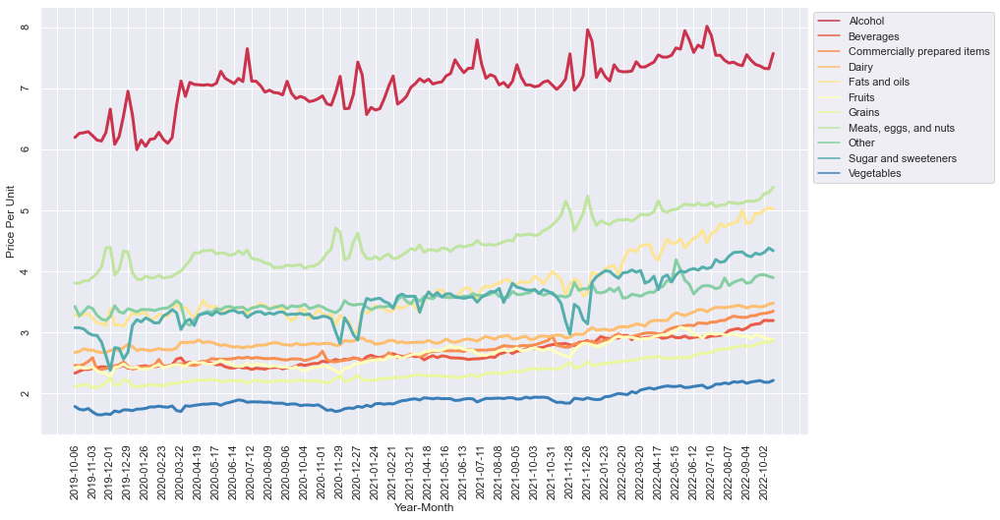

In [49]:
#showcase tennessee price per unit sales throughout the three years utilizing ticker import
import matplotlib.ticker as ticker
sns.set_style('whitegrid')
sns.set(rc={'figure.figsize':(14,8)})

ax = sns.lineplot(data=df, x ='Date', y = 'Price_per_Unit',
                  hue='Category', palette='Spectral',
                  legend='full', lw=3)

ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.legend(bbox_to_anchor=(1, 1))
plt.ylabel('Price Per Unit')
plt.xlabel('Year-Month')
ax.tick_params(rotation=90)
plt.show()